In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")

from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.model_selection import train_test_split

In [2]:
df = pd.read_excel('innomatics1.xlsx', index_col=0)
df.head(5)

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
Aother,,,,,,,,,,,,,,,,,,,,,
train,203097,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.3,"board ofsecondary education,ap",...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
train,579905,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.4,cbse,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
train,810601,325000,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,85.0,cbse,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
train,267447,1100000,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,85.6,cbse,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
train,343523,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,78.0,cbse,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [3]:
df.describe()

,ID,Salary,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
count,3.998000e+03,3.998000e+03,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,...,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000
mean,6.637945e+05,3.076998e+05,77.925443,2008.087544,74.466366,5156.851426,1.925713,71.486171,5156.851426,0.300400,...,90.742371,22.974737,16.478739,31.851176,2.683842,-0.037831,0.146496,0.002763,-0.169033,-0.138110
std,3.632182e+05,2.127375e+05,9.850162,1.653599,10.999933,4802.261482,0.262270,8.167338,4802.261482,0.458489,...,175.273083,98.123311,87.585634,104.852845,36.658505,1.028666,0.941782,0.951471,1.007580,1.008075
min,1.124400e+04,3.500000e+04,43.000000,1995.000000,40.000000,2.000000,1.000000,6.450000,2.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-4.126700,-5.781600,-4.600900,-2.643000,-7.375700
25%,3.342842e+05,1.800000e+05,71.680000,2007.000000,66.000000,494.000000,2.000000,66.407500,494.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.713525,-0.287100,-0.604800,-0.868200,-0.669200
50%,6.396000e+05,3.000000e+05,79.150000,2008.000000,74.400000,3879.000000,2.000000,71.720000,3879.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.046400,0.212400,0.091400,-0.234400,-0.094300
75%,9.904800e+05,3.700000e+05,85.670000,2009.000000,82.600000,8818.000000,2.000000,76.327500,8818.000000,1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.702700,0.812800,0.672000,0.526200,0.502400
max,1.298275e+06,4.000000e+06,97.760000,2013.000000,98.700000,18409.000000,2.000000,99.930000,18409.000000,1.000000,...,715.000000,623.000000,676.000000,548.000000,516.000000,1.995300,1.904800,2.535400,3.352500,1.822400


In [14]:
pd.crosstab(df["Salary"], df["12graduation"])

12graduation,1995,1998,1999,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Salary,,,,,,,,,,,,,,,,
35000,0,0,0,0,0,0,0,0,0,2,0,0,1,0,0,0
40000,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0
45000,0,0,0,0,0,0,0,0,0,0,2,2,0,0,0,0
50000,0,0,0,0,0,0,0,0,1,2,1,0,1,0,0,0
55000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2500000,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
2600000,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3000000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


In [8]:
df["12percentage"].value_counts(normalize=True)

70.00    0.018009
72.00    0.017009
74.00    0.015758
62.00    0.014507
68.00    0.014507
           ...   
53.16    0.000250
83.16    0.000250
65.54    0.000250
90.03    0.000250
94.80    0.000250
Name: 12percentage, Length: 801, dtype: float64

In [7]:
df["Gender"].value_counts()

m    3041
f     957
Name: Gender, dtype: int64

In [9]:
df.apply(np.max)

TypeError: '>=' not supported between instances of 'str' and 'datetime.datetime'

In [3]:
df.shape

(3998, 38)

**UNIVARIATE ANALYSiS**

**Histogram Plot**

A histogram is a plot that lets you discover, and show, the underlying frequency distribution (shape) of a set of continuous data. This allows the inspection of the data for its underlying distribution 

array([[<AxesSubplot:title={'center':'ID'}>,
        <AxesSubplot:title={'center':'Salary'}>,
        <AxesSubplot:title={'center':'DOJ'}>,
        <AxesSubplot:title={'center':'DOB'}>,
        <AxesSubplot:title={'center':'10percentage'}>],
       [<AxesSubplot:title={'center':'12graduation'}>,
        <AxesSubplot:title={'center':'12percentage'}>,
        <AxesSubplot:title={'center':'CollegeID'}>,
        <AxesSubplot:title={'center':'CollegeTier'}>,
        <AxesSubplot:title={'center':'collegeGPA'}>],
       [<AxesSubplot:title={'center':'CollegeCityID'}>,
        <AxesSubplot:title={'center':'CollegeCityTier'}>,
        <AxesSubplot:title={'center':'GraduationYear'}>,
        <AxesSubplot:title={'center':'English'}>,
        <AxesSubplot:title={'center':'Logical'}>],
       [<AxesSubplot:title={'center':'Quant'}>,
        <AxesSubplot:title={'center':'Domain'}>,
        <AxesSubplot:title={'center':'ComputerProgramming'}>,
        <AxesSubplot:title={'center':'ElectronicsAndSemic

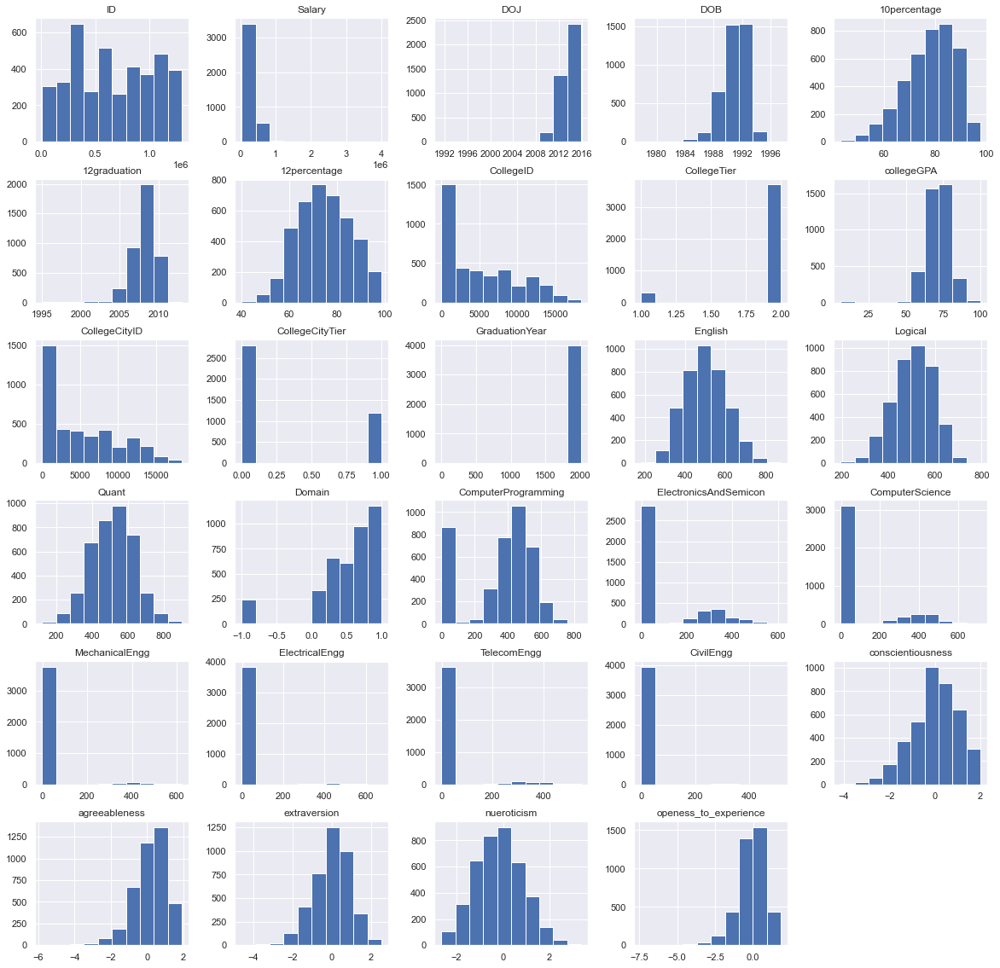

In [4]:
df.hist(figsize=(20,20))

Continuous numerical variables:

In [5]:
print(df.dtypes)

ID                                int64
Salary                            int64
DOJ                      datetime64[ns]
DOL                              object
Designation                      object
JobCity                          object
Gender                           object
DOB                      datetime64[ns]
10percentage                    float64
10board                          object
12graduation                      int64
12percentage                    float64
12board                          object
CollegeID                         int64
CollegeTier                       int64
Degree                           object
Specialization                   object
collegeGPA                      float64
CollegeCityID                     int64
CollegeCityTier                   int64
CollegeState                     object
GraduationYear                    int64
English                           int64
Logical                           int64
Quant                             int64


<AxesSubplot:xlabel='12graduation', ylabel='Salary'>

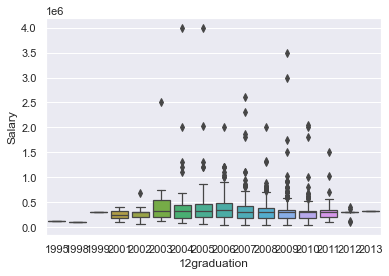

In [6]:
sns.boxplot(x=df["12graduation"],y=df["Salary"],width=0.8,linewidth=1.25)

<AxesSubplot:xlabel='Quant', ylabel='Salary'>

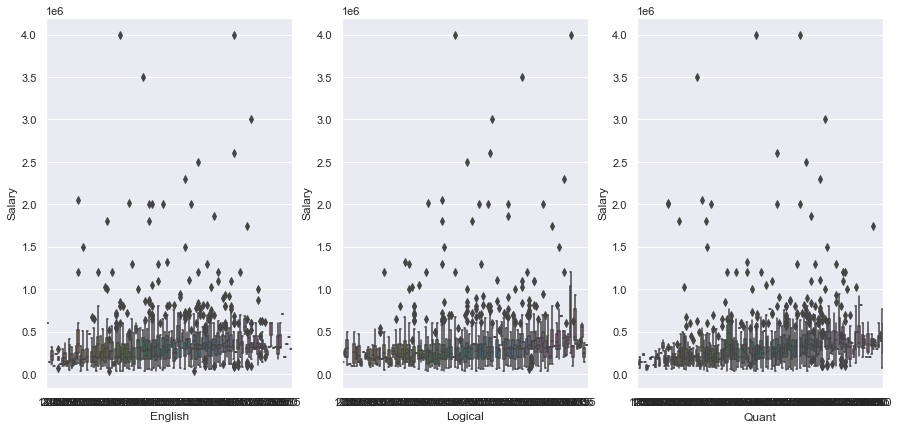

In [7]:
plt.figure(figsize = (15,15))
plt.subplot(2,3,1)
sns.boxplot(x=df["English"],y=df["Salary"])
plt.subplot(2,3,2)
sns.boxplot(x=df["Logical"],y=df["Salary"])
plt.subplot(2,3,3)
sns.boxplot(x=df["Quant"],y=df["Salary"])

ValueError: num must be 1 <= num <= 6, not 7

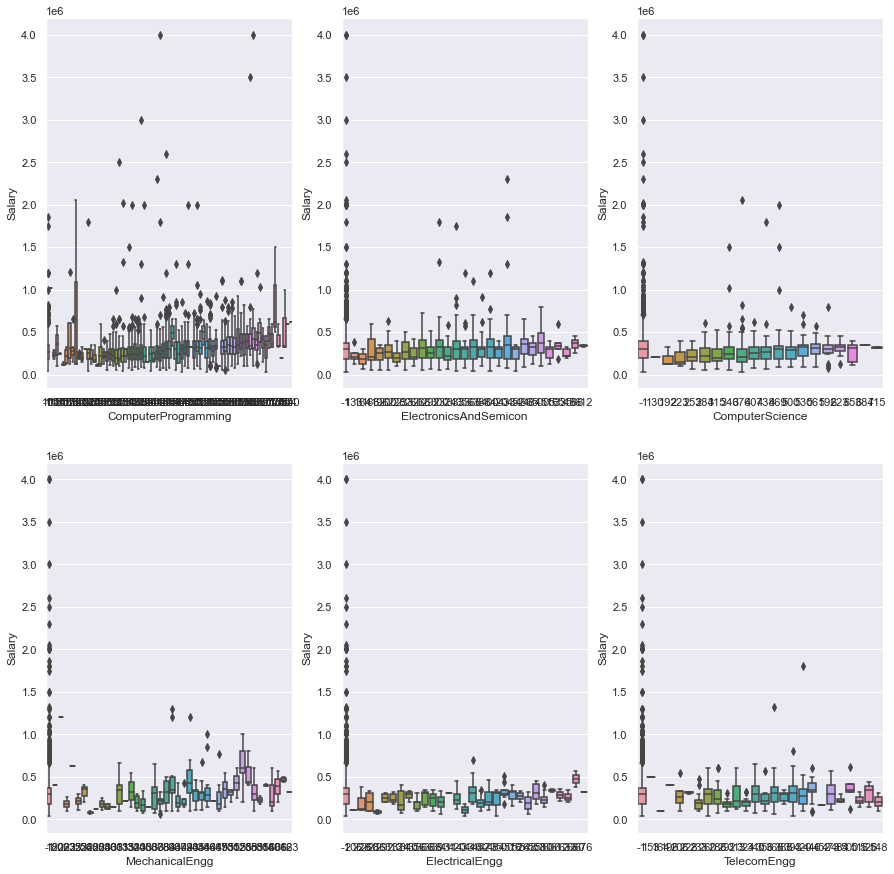

In [8]:
plt.figure(figsize = (15,15))
plt.subplot(2,3,1)
sns.boxplot(x=df["ComputerProgramming"],y=df["Salary"])
plt.subplot(2,3,2)
sns.boxplot(x=df["ElectronicsAndSemicon"],y=df["Salary"])
plt.subplot(2,3,3)
sns.boxplot(x=df["ComputerScience"],y=df["Salary"])
plt.subplot(2,3,4)
sns.boxplot(x=df["MechanicalEngg"],y=df["Salary"])
plt.subplot(2,3,5)
sns.boxplot(x=df["ElectricalEngg"],y=df["Salary"])
plt.subplot(2,3,6)
sns.boxplot(x=df["TelecomEngg"],y=df["Salary"])
plt.subplot(2,3,7)
sns.boxplot(x=df["CivilEngg"],y=df["Salary"])

(0.0, 2.3014)

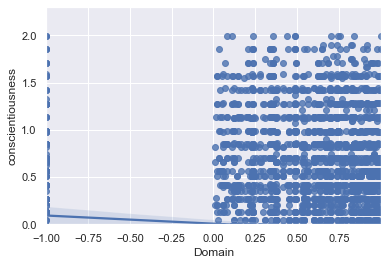

In [9]:
sns.regplot(x="Domain", y="conscientiousness", data=df)
plt.ylim(0,)

C:\Users\admin\anaconda3\envs\myenv\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


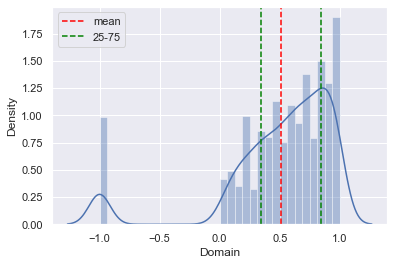

In [10]:
sns.distplot(df["Domain"])
plt.axvline(x=np.mean(df["Domain"]),c="red",ls="--",label="mean")
plt.axvline(x=np.percentile(df["Domain"],25),c="green",ls="--",label="25-75")
plt.axvline(x=np.percentile(df["Domain"],75),c="green",ls="--")
plt.legend()

In [11]:
print(df.dtypes)

ID                                int64
Salary                            int64
DOJ                      datetime64[ns]
DOL                              object
Designation                      object
JobCity                          object
Gender                           object
DOB                      datetime64[ns]
10percentage                    float64
10board                          object
12graduation                      int64
12percentage                    float64
12board                          object
CollegeID                         int64
CollegeTier                       int64
Degree                           object
Specialization                   object
collegeGPA                      float64
CollegeCityID                     int64
CollegeCityTier                   int64
CollegeState                     object
GraduationYear                    int64
English                           int64
Logical                           int64
Quant                             int64


<AxesSubplot:xlabel='count', ylabel='Degree'>

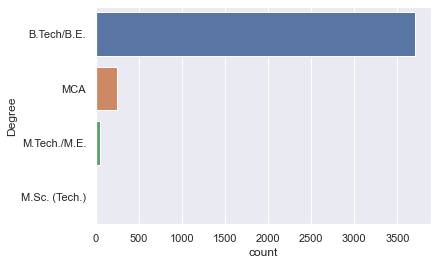

In [12]:
sns.countplot(y=df["Degree"])


#plt.axvline(x=np.mean(df["12graduation"]),c="red",ls="--",label="mean")
#plt.axvline(x=np.percentile(df["Domain"],25),c="green",ls="--",label="25-75")
#plt.axvline(x=np.percentile(df["Domain"],75),c="green",ls="--")
#plt.legend()

<AxesSubplot:xlabel='10board', ylabel='count'>

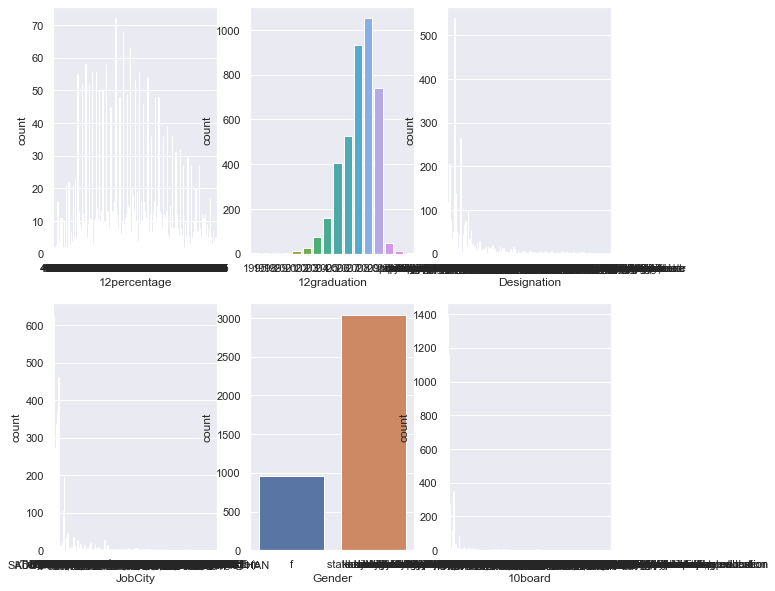

In [13]:
plt.figure(figsize=(10,10))
plt.subplot(2,3,1)
sns.countplot(x=df["12percentage"])
plt.subplot(2,3,2)
sns.countplot(x=df["12graduation"])
plt.subplot(2,3,3)
sns.countplot(x=df["Designation"])
plt.subplot(2,3,4)
sns.countplot(x=df["JobCity"])
plt.subplot(2,3,5)
sns.countplot(x=df["Gender"])
plt.subplot(2,3,6)
sns.countplot(x=df["10board"])


In [14]:
df["Domain"].value_counts()

-1.000000    246
 0.622643    113
 0.538387    110
 0.486747    106
 0.744758    103
            ... 
 0.021066      1
 0.965327      1
 0.027815      1
 0.885704      1
 0.282788      1
Name: Domain, Length: 243, dtype: int64

Bivirate Analysis

C:\Users\admin\anaconda3\envs\myenv\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\admin\anaconda3\envs\myenv\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\admin\anaconda3\envs\myenv\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warn

<AxesSubplot:xlabel='Gender', ylabel='English'>

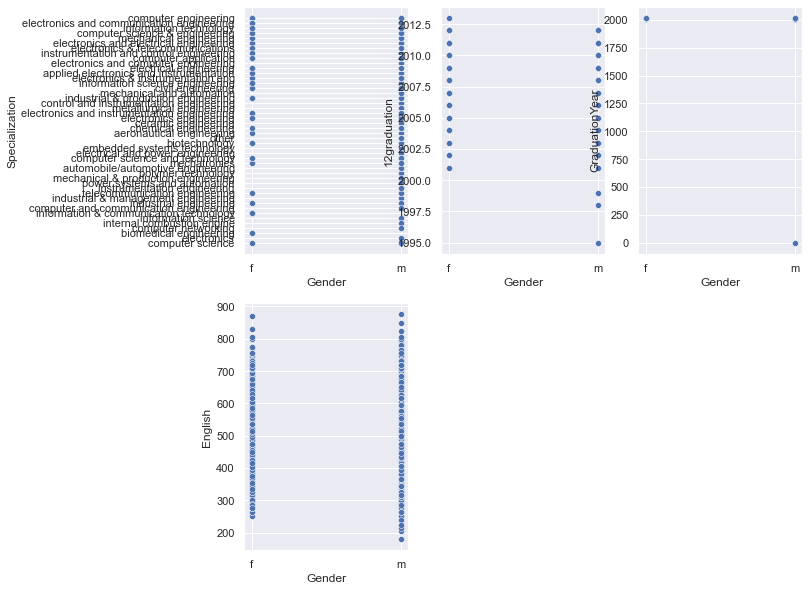

In [15]:
plt.figure(figsize=(10,10))
plt.subplot(2,3,1)
sns.scatterplot(df["Gender"],df["Specialization"])
plt.subplot(2,3,2)
sns.scatterplot(df["Gender"],df["12graduation"])
plt.subplot(2,3,3)
sns.scatterplot(df["Gender"],df["GraduationYear"])
plt.subplot(2,3,4)
sns.scatterplot(df["Gender"],df["English"])

<AxesSubplot:xlabel='12graduation', ylabel='English'>

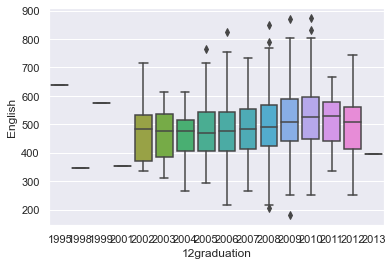

In [16]:
sns.boxplot(x=df["12graduation"],y=df["English"])

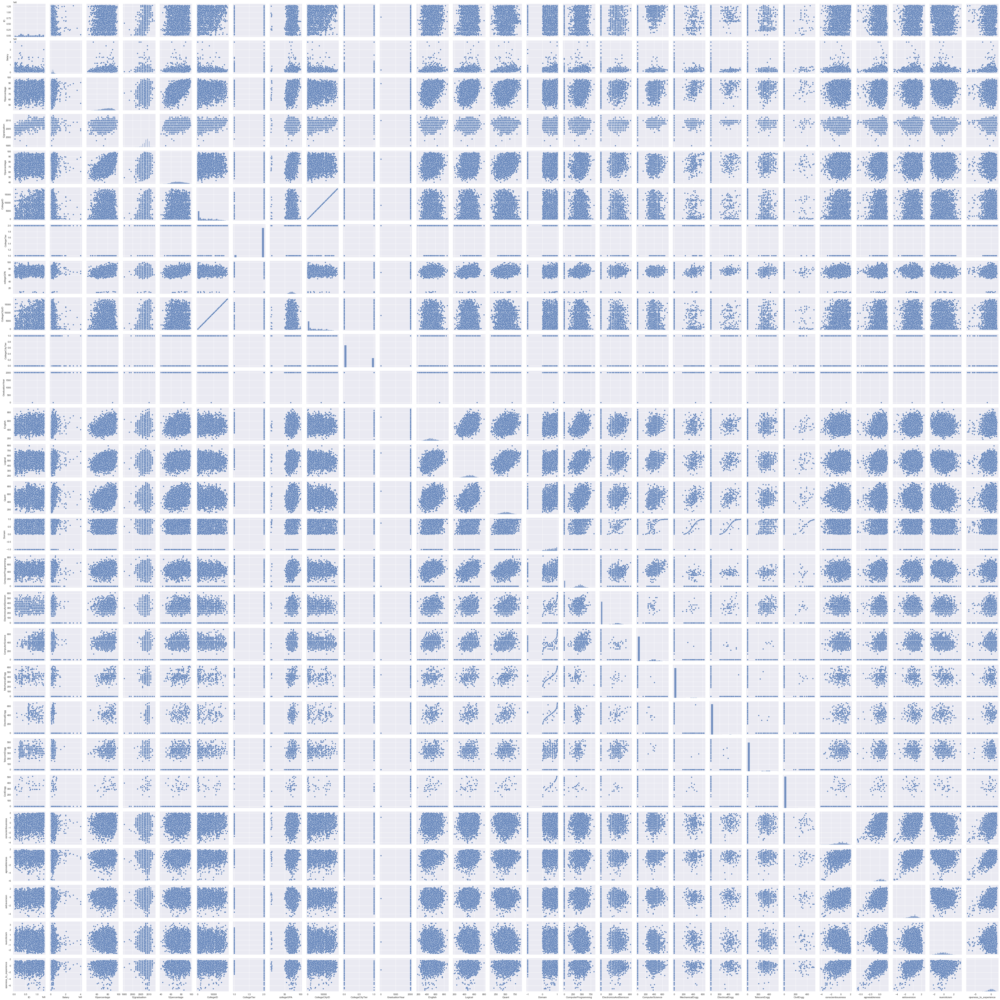

In [17]:
sns.pairplot(df)

In [18]:
df.duplicated().sum()

0

In [19]:
#df[df.duplicated==True]

In [20]:
df.drop_duplicates(inplace=True)

In [21]:
df.isna().sum()

ID                       0
Salary                   0
DOJ                      0
DOL                      0
Designation              0
JobCity                  0
Gender                   0
DOB                      0
10percentage             0
10board                  0
12graduation             0
12percentage             0
12board                  0
CollegeID                0
CollegeTier              0
Degree                   0
Specialization           0
collegeGPA               0
CollegeCityID            0
CollegeCityTier          0
CollegeState             0
GraduationYear           0
English                  0
Logical                  0
Quant                    0
Domain                   0
ComputerProgramming      0
ElectronicsAndSemicon    0
ComputerScience          0
MechanicalEngg           0
ElectricalEngg           0
TelecomEngg              0
CivilEngg                0
conscientiousness        0
agreeableness            0
extraversion             0
nueroticism              0
o

<AxesSubplot:ylabel='Aother'>

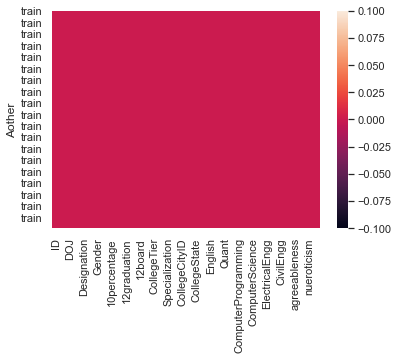

In [22]:
sns.heatmap(df.isnull())

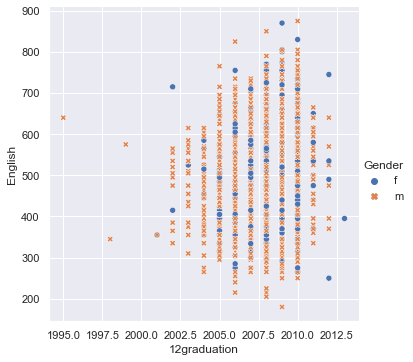

In [23]:

sns.relplot(x="12graduation", y="English", hue="Gender", style="Gender", data=df);

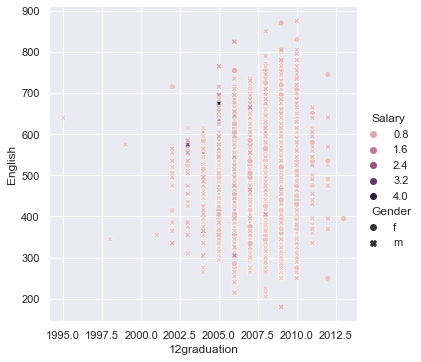

In [24]:
sns.relplot(x="12graduation", y="English", hue="Salary", style="Gender", data=df);

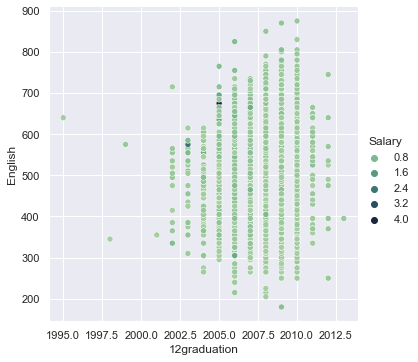

In [25]:
sns.relplot(x="12graduation", y="English", hue="Salary", palette="ch:r=-.5,l=.75", data=df);

C:\Users\admin\anaconda3\envs\myenv\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 28.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\admin\anaconda3\envs\myenv\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 44.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\admin\anaconda3\envs\myenv\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 69.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\admin\anaconda3\envs\myenv\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 81.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\admin\anaconda3\envs\myenv\lib\site-packages\seabor

<AxesSubplot:xlabel='12graduation', ylabel='Salary'>

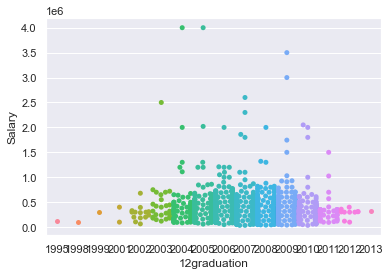

In [26]:
ax = sns.swarmplot(x="12graduation", y="Salary", size=5, data=df)
ax

In [ ]:
plt.figure(figsize=(12,12))
plt.subplot(2,3,1)
sns.swarmplot(x="Gender", y="Specialization", size=1, data=df)
plt.subplot(2,3,2)
sns.swarmplot(x="Gender", y="12graduation", size=1, data=df)
plt.subplot(2,3,3)
sns.swarmplot(x="Gender", y="GraduationYear", size=1, data=df)
plt.subplot(2,3,4)
sns.swarmplot(x="Gender", y="English", size=1, data=df)


**HEXBIN PLOT**

In [ ]:
ax = df.plot.hexbin(x="12graduation", y="Salary", gridsize=15)

In [ ]:
from sklearn.preprocessing import StandardScaler
df = StandardScaler().fit_transform(df[['Gender', 'Specialization']])